In [4]:
# pip install torchvision

In [1]:
import numpy as np
import pandas as pd
import scipy
import pickle
import random
import os

# loading in and transforming data
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import PIL
from PIL import Image
import imageio

# visualizing data
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

ModuleNotFoundError: No module named 'torchvision'

In [62]:
# trainA_path = '/kaggle/input/vangogh2photo/vangogh2photo/trainA'
# trainB_path = '/kaggle/input/vangogh2photo/vangogh2photo/trainB'

trainA_path = '/kaggle/input/horse2zebra-dataset/trainA'
trainB_path = '/kaggle/input/horse2zebra-dataset/trainB'

### Hiển thị ảnh

In [63]:
def show_test(fixed_Y, fixed_X, G_YtoX, G_XtoY, mean_=0.5, std_=0.5):
    """
     - Hiển thị kết quả của G dựa trên ảnh test
    """
    # Xác định thiết bị đang ở chế độ train GPU hay CPU
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    # Dùng G để tạo ra ảnh giả và khôi phục lại 
    fake_X = G_YtoX(fixed_Y.to(device))
    fake_Y = G_XtoY(fixed_X.to(device))
    
    # Tạo lưới 
    grid_x =  make_grid(fixed_X, nrow=2).permute(1, 2, 0).detach().cpu().numpy()
    grid_y =  make_grid(fixed_Y, nrow=2).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_x =  make_grid(fake_X, nrow=2).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_y =  make_grid(fake_Y, nrow=2).permute(1, 2, 0).detach().cpu().numpy()
    
    # chuyển về ảnh [0 --> 255]
#     X, fake_X = reverse_normalize(grid_x, mean_, std_), reverse_normalize(grid_fake_x, mean_, std_)
#     Y, fake_Y = reverse_normalize(grid_y, mean_, std_), reverse_normalize(grid_fake_y, mean_, std_)
    X, fake_X = reverse_normalize(grid_x), reverse_normalize(grid_fake_x)
    Y, fake_Y = reverse_normalize(grid_y), reverse_normalize(grid_fake_y)
    
    # Hiển thị  
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(20, 10))
    ax1.imshow(X)
    ax1.axis('off')
    ax1.set_title('X')
    ax2.imshow(fake_Y)
    ax2.axis('off')
    ax2.set_title('Fake Y')
    ax3.imshow(Y)
    ax3.axis('off')
    ax3.set_title('Y')
    ax4.imshow(fake_X)
    ax4.axis('off')
    ax4.set_title('Fake X')
    plt.show()


In [64]:
# Revert lại ảnh có pixel từ [0;1] sang [0,255]
def reverse_normalize(image, mean_=0.5, std_=0.5):
    if torch.is_tensor(image):
        image = image.detach().numpy()
    un_normalized_img = image * std_ + mean_
    un_normalized_img = un_normalized_img * 255
    return np.uint8(un_normalized_img)

### Class Custom lại data

In [65]:
class ImageDataset(Dataset):
        """
        Custom dataset
        """
        
        def __init__(self, img_path, img_size=256, normalize=True, transform=None):
            self.img_path = img_path
            
            if normalize:
                self.transform = transforms.Compose([
                    transforms.Resize(img_size),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5])
                ])
            else:
                self.transform = transforms.Compose([
                    transforms.Resize(img_size),
                    transforms.ToTensor()
                ])
            
            #Dictionary entries
            self.img_idx = dict()
            for number_, img_ in enumerate(os.listdir(self.img_path)):
                self.img_idx[number_] = img_
                
        def __len__(self):
            #Length of dataset --> number of images
            return len(self.img_idx)
        
#         def __getitem__(self, idx):
#             img_path = os.path.join(self.img_path, self.img_idx[idx])
#             img = Image.open(img_path)
#             img = self.transform(img)
            
#             return img
        
        def __getitem__(self, idx):
            img_path = os.path.join(self.img_path, self.img_idx[idx])
            img = Image.open(img_path).convert("RGB")  # Chuyển đổi ảnh sang RGB

            if self.transform:
                img = self.transform(img)

            return img

## Load data

In [66]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class ImageFolderDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir)]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

In [68]:
# Định nghĩa các transform để chuẩn hóa hình ảnh
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Thay đổi kích thước ảnh nếu cần
    transforms.ToTensor()
])

# Tạo dataset và dataloader
trainA_dataset = ImageDataset(trainA_path, transform=transform)
trainB_dataset = ImageDataset(trainB_path, transform=transform)

batch_size_test = 4
batch_size = 8

test_dataloader_Y = DataLoader(trainA_dataset, batch_size=batch_size_test, \
                               shuffle=False, num_workers=0, pin_memory=True)
test_dataloader_X = DataLoader(trainB_dataset, batch_size=batch_size_test, \
                               shuffle=False, num_workers=0, pin_memory=True)
dataloader_Y = DataLoader(trainA_dataset, batch_size=batch_size, \
                          shuffle=True, num_workers=0, pin_memory=True)
dataloader_X = DataLoader(trainB_dataset, batch_size=batch_size, \
                          shuffle=True, num_workers=0, pin_memory=True)

# Kiểm tra số lượng batch
print(len(test_dataloader_Y))

267


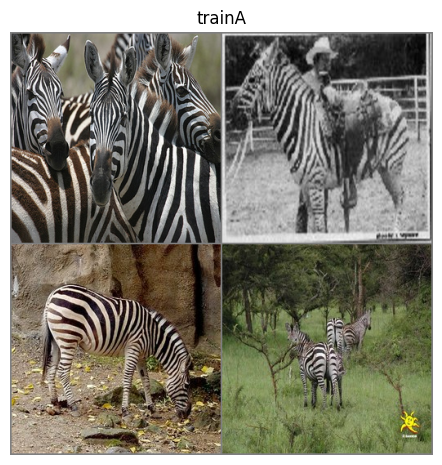

In [69]:
# Lấy một batch từ test_dataloader_X
# dataiter = iter(test_dataloader_X)
# images_normalized = next(dataiter)
# images_normalized, labels = random.choice(dataiter)

all_batches = list(test_dataloader_X)

# Chọn một batch ngẫu nhiên
images_normalized = random.choice(all_batches)

# Tạo grid ảnh
grid_normalized = make_grid(images_normalized, nrow=2).permute(1, 2, 0).detach().numpy()

# Giả sử reverse_normalize được định nghĩa ở nơi khác
# Đảm bảo reverse_normalize xử lý đúng các mảng numpy hoặc chuyển đổi lại thành tensor nếu cần
# def reverse_normalize(image):
#     # Giả định reverse_normalize đảo ngược các thao tác normalize, nếu có
#     return image

grid_original = reverse_normalize(grid_normalized)

# Hiển thị ảnh
fig = plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(grid_original)
plt.axis('off')
plt.title('trainA')
plt.show()

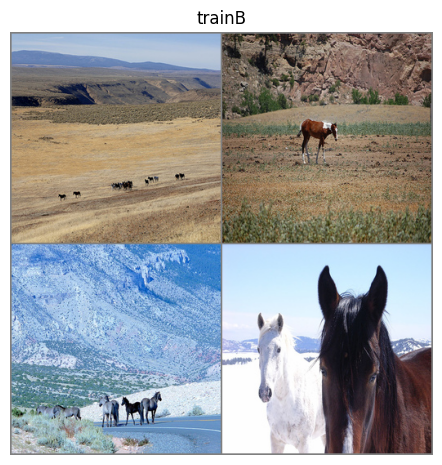

In [70]:
all_batches = list(test_dataloader_Y)

# Chọn một batch ngẫu nhiên
images_normalized = random.choice(all_batches)

# Tạo grid ảnh
grid_normalized = make_grid(images_normalized, nrow=2).permute(1, 2, 0).detach().numpy()


grid_original = reverse_normalize(grid_normalized)

# Hiển thị ảnh
fig = plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(grid_original)
plt.axis('off')
plt.title('trainB')
plt.show()

## Build model

In [71]:
import torch.nn as nn
import torch.nn.functional as F

def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False):
    """
    Creates a convolutional layer, with optional batch / instance normalization. 
    """
    
    #Add layers
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)
    
    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    return nn.Sequential(*layers)

### Discriminator

In [72]:
class Discriminator(nn.Module):
    
    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        """
        Input is RGB image (256x256x3) while output is a single value
        
        determine size = [(W−K+2P)/S]+1
        W: input=256
        K: kernel_size=4
        P: padding=1
        S: stride=2
        """
        
        #convolutional layers, increasing in depth
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4) 
                                                            # (128, 128, 64)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, \
                          kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, \
                          kernel_size=4, instance_norm=True) # (32, 32, 256)
        self.conv4 = conv(in_channels=conv_dim*4, out_channels=conv_dim*8, \
                          kernel_size=4, instance_norm=True) # (16, 16, 512)
        self.conv5 = conv(in_channels=conv_dim*8, out_channels=conv_dim*8, \
                          kernel_size=4, batch_norm=True) # (8, 8, 512)
        
        #final classification layer
        self.conv5 = conv(conv_dim*8, out_channels=1, kernel_size=4, stride=1) 
                                                                    # (8, 8, 1)
    
    def forward(self, x):
        
        #leaky relu applied to all conv layers but last
        out = F.leaky_relu(self.conv1(x), negative_slope=0.2)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv4(out), negative_slope=0.2)
#         out = F.leaky_relu(self.conv5(out), negative_slope=0.2)
        
        #classification layer (--> depending on the loss function we might want to use an activation function here, e.g. sigmoid)
        out = self.conv5(out)
        return out

In [73]:
class ResidualBlock(nn.Module):

    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        """
        Residual blocks help the model to effectively learn the transformation from one domain to another. 
        """
        self.conv1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=False)#True)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=False)#True)
        
    def forward(self, x):
        out_1 = F.relu(self.conv1(x))
        out_2 = x + self.conv2(out_1)
        return out_2

### Lớp deconv

In [74]:
def deconv(in_channels, out_channels, kernel_size, stride=2, \
           padding=1, batch_norm=False, instance_norm=False, \
           dropout=False, dropout_ratio=0.5):
    """
    Creates a transpose convolutional layer, with optional batch / instance normalization. 
    Select either batch OR instance normalization. 
    """
    
    #Add layers
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, \
                                     kernel_size, stride, padding, \
                                     bias=False))
    
    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))
    
    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    
    #Dropout
#     if dropout:
#         layers.append(nn.Dropout2d(dropout_ratio))
    
    return nn.Sequential(*layers)

### CycleGenerator

In [75]:
class CycleGenerator(nn.Module):
    
    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()
        """
        Input is RGB image (256x256x3) while output is a single value
        
        determine size = [(W−K+2P)/S]+1
        W: input=256
        K: kernel_size=4
        P: padding=1
        S: stride=2
        """
        
        #Encoder layers
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, \
                          kernel_size=4) # (128, 128, 64)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, \
                          kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, \
                          kernel_size=4, instance_norm=True) # (32, 32, 256)
        
        #Residual blocks (number depends on input parameter)
        res_layers = []
        for layer in range(n_res_blocks):
            res_layers.append(ResidualBlock(conv_dim*4))
        self.res_blocks = nn.Sequential(*res_layers)
        
        #Decoder layers
        self.deconv4 = deconv(in_channels=conv_dim*4, out_channels=conv_dim*2, \
                              kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.deconv5 = deconv(in_channels=conv_dim*2, out_channels=conv_dim, \
                              kernel_size=4, instance_norm=True) # (128, 128, 64)
        self.deconv6 = deconv(in_channels=conv_dim, out_channels=3, \
                              kernel_size=4, instance_norm=True) # (256, 256, 3)
        
    def forward(self, x):
        """
        Given an image x, returns a transformed image.
        """
        
        #Encoder
        out = F.leaky_relu(self.conv1(x), negative_slope=0.2) # (128, 128, 64)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2) # (64, 64, 128)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2) # (32, 32, 256)
        
        #Residual blocks
        out = self.res_blocks(out)
        
        #Decoder
        out = F.leaky_relu(self.deconv4(out), negative_slope=0.2) # (64, 64, 128)
        out = F.leaky_relu(self.deconv5(out), negative_slope=0.2) # (128, 128, 64)
        out = torch.tanh(self.deconv6(out)) # (256, 256, 3)
        
        return out

### Khởi tạo trọng số

In [76]:
from torch.nn import init
def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model.
    The weights are taken from a normal distribution with mean = 0, std dev = 0.02.
    Param m: A module or layer in a network    
    """
    #classname will be something like: `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__
    
    #normal distribution with given paramters
    std_dev = 0.02
    mean = 0.0
    
    # Initialize conv layer
    if hasattr(m, 'weight') and (classname.find('Conv') != -1):
        init.normal_(m.weight.data, mean, std_dev)

### Kết hợp Generator và Discriminator

In [77]:
def build_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """
    Builds generators G_XtoY & G_YtoX and discriminators D_X & D_Y 
    """
    
    #Generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    
    #Discriminators
    D_X = Discriminator(conv_dim=d_conv_dim) # Y-->X
    D_Y = Discriminator(conv_dim=d_conv_dim) # X-->Y
    
    #Weight initialization
    G_XtoY.apply(weights_init_normal)
    G_YtoX.apply(weights_init_normal)
    D_X.apply(weights_init_normal)
    D_Y.apply(weights_init_normal)
    
    #Moves models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [78]:
G_XtoY, G_YtoX, D_X, D_Y = build_model()

Models moved to GPU.


In [79]:
# G_YtoX

### Định nghĩa hàm loss

In [80]:
def real_mse_loss(D_out, adverserial_weight=1):
    #how close is the produced output from being "real"?
    mse_loss = torch.mean((D_out-1)**2)*adverserial_weight
    return mse_loss

def fake_mse_loss(D_out, adverserial_weight=1):
    #how close is the produced output from being "false"?
    mse_loss = torch.mean(D_out**2)*adverserial_weight
    return mse_loss

def cycle_consistency_loss(real_img, reconstructed_img, lambda_weight=1):
    reconstr_loss = torch.mean(torch.abs(real_img - reconstructed_img))
    return lambda_weight*reconstr_loss 

def identity_loss(real_img, generated_img, identity_weight=1):
    ident_loss = torch.mean(torch.abs(real_img - generated_img))
    return identity_weight*ident_loss

### Khởi tạo optimizer (Adam)

In [81]:
import torch.optim as optim

#hyperparameter
lr=0.0002 #0.0002
beta1=0.500 #exponential decay rate for the first moment estimates
beta2=0.999 #exponential decay rate for the second-moment estimates
g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())

#Optimizers for generator and discriminator
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

### Lưu kết quả mỗi lần lặp checkpoint

In [83]:
# def save_checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir='checkpoints'):
#     """
#     Lưu lại parameters so mỗi lần lặp
#     """
#     if not os.path.exists(checkpoint_dir):
#         os.makedirs(checkpoint_dir)
    
#     #Path
#     G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
#     G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
#     D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
#     D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
#     #Saving
#     torch.save(G_XtoY.state_dict(), G_XtoY_path)
#     torch.save(G_YtoX.state_dict(), G_YtoX_path)
#     torch.save(D_X.state_dict(), D_X_path)
#     torch.save(D_Y.state_dict(), D_Y_path)
    


def save_checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, d_total_loss_avg, g_total_loss_avg, d_total_loss, g_total_loss, checkpoint_dir='checkpoints'):
    """
    Lưu lại parameters và losses mỗi lần lặp
    """
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    # Path
    G_XtoY_path = os.path.join(checkpoint_dir, f'G_XtoY_{iteration}.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, f'G_YtoX_{iteration}.pkl')
    D_X_path = os.path.join(checkpoint_dir, f'D_X_{iteration}.pkl')
    D_Y_path = os.path.join(checkpoint_dir, f'D_Y_{iteration}.pkl')
    losses_path = os.path.join(checkpoint_dir, 'losses.txt')
    

    # Saving model weights
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)

    # Saving losses
    with open(losses_path, 'a') as f:
        f.write(f'{iteration},{d_total_loss_avg},{g_total_loss_avg},{d_total_loss},{g_total_loss}\n')
        
###########################################

def save_checkpoint2(iteration, G_XtoY, G_YtoX, D_X, D_Y, d_total_loss_avg, g_total_loss_avg, d_total_loss, g_total_loss):
    """
    Lưu lại parameters và losses mỗi lần lặp
    """
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    
    # Path
    G_XtoY_path = os.path.join(f'G_XtoY_{iteration}.pkl')
    G_YtoX_path = os.path.join(f'G_YtoX_{iteration}.pkl')
    D_X_path = os.path.join(f'D_X_{iteration}.pkl')
    D_Y_path = os.path.join(f'D_Y_{iteration}.pkl')
    losses_path = os.path.join('losses_.txt')
    

    # Saving model weights
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)

    # Saving losses
    with open(losses_path, 'a') as f:
        f.write(f'{iteration},{d_total_loss_avg},{g_total_loss_avg},{d_total_loss},{g_total_loss}\n')

### Load checkpoint

In [84]:
# def load_checkpoint(checkpoint_path, map_location=None):
#     """
#     Load checkoint
#     """
#     #model.load_state_dict(torch.load(checkpoint_path))
#     checkpoint = torch.load(checkpoint_path, map_location=map_location)
#     print(' [*] Loading checkpoint from %s succeed!' % checkpoint_path)
#     return checkpoint


def load_checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir=''):
    """
    Load model parameters from checkpoint directory
    """
    G_XtoY_path = os.path.join(checkpoint_dir, f'G_XtoY_{iteration}.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, f'G_YtoX_{iteration}.pkl')
    D_X_path = os.path.join(checkpoint_dir, f'D_X_{iteration}.pkl')
    D_Y_path = os.path.join(checkpoint_dir, f'D_Y_{iteration}.pkl')
    
    G_XtoY.load_state_dict(torch.load(G_XtoY_path))
    G_YtoX.load_state_dict(torch.load(G_YtoX_path))
    D_X.load_state_dict(torch.load(D_X_path))
    D_Y.load_state_dict(torch.load(D_Y_path))
    print("Checkpoint loaded successfully")

##  Train model

In [85]:
test_iter_X = iter(test_dataloader_X)
test_iter_Y = iter(test_dataloader_Y)
fixed_X = next(test_iter_X)
fixed_Y = next(test_iter_Y)

# batches per epoch
iter_X = iter(dataloader_X)
iter_Y = iter(dataloader_Y)
batches_per_epoch = min(len(iter_X), len(iter_Y))
batches_per_epoch
len(iter_Y)

134

In [86]:
# if epoch % batches_per_epoch == 0:
# iter_X = iter(dataloader_X)
# iter_Y = iter(dataloader_Y)

# #Get images from domain X
# images_X = next(iter_X)

# #Get images from domain Y
# images_Y = next(iter_Y)
# images_X

In [87]:
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=100):
    
    #Losses over time
    losses = []
    
    #Additional weighting parameters (in reality only 2 are required as the third is kind of "given relatively" by the other two)
    adverserial_weight = 0.5
    lambda_weight = 5
    identity_weight = 2
    
    #Get some fixed data from domains X and Y for sampling. Images are held constant throughout training and allow us to inspect the model's performance.
    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)
    fixed_X = next(test_iter_X)
    fixed_Y = next(test_iter_Y)
    
    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))
    
    #Average loss over batches per epoch runs
    d_total_loss_avg = 0.0
    g_total_loss_avg = 0.0
    
    #Loop through epochs
    for epoch in range(1, n_epochs+1):
        
        #reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)
        
        #Get images from domain X
        images_X = next(iter_X)
        
        #Get images from domain Y
        images_Y = next(iter_Y)
        
        #move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)
        
        
        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================
        
        
        # --------------------------------------------
        ## First: D_X, real and fake loss components
        # --------------------------------------------
        
        # Train with real images
        d_x_optimizer.zero_grad()
        
        # 1. Compute the discriminator losses on real images
        out_x = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x, adverserial_weight)
        
        # Train with fake images
        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # 3. Compute the fake loss for D_X
        out_x = D_X(fake_X)
        D_X_fake_loss = fake_mse_loss(out_x, adverserial_weight)
        
        # 4. Compute the total loss and perform backpropagation
        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward()
        d_x_optimizer.step()
        
        # --------------------------------------------
        ## Second: D_Y, real and fake loss components
        # --------------------------------------------
        
        # Train with real images
        d_y_optimizer.zero_grad()
        
        # 1. Compute the discriminator losses on real images
        out_y = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y, adverserial_weight)
        
        # Train with fake images
        # 2. Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)
        
        # 3. Compute the fake loss for D_Y
        out_y = D_Y(fake_Y)
        D_Y_fake_loss = fake_mse_loss(out_y, adverserial_weight)
        
        # 4. Compute the total loss and perform backprop
        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward()
        d_y_optimizer.step()
        
        # 5. Compute total discriminator loss
        d_total_loss = D_X_real_loss + D_X_fake_loss + D_Y_real_loss + D_Y_fake_loss
        

        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================
        
        
        # --------------------------------------------
        ## First: generate fake X images and reconstructed Y images
        # --------------------------------------------
        
        #Back to the start
        g_optimizer.zero_grad()
        
        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)
        
        # 2. Compute the generator loss based on domain X
        out_x = D_X(fake_X)
        g_YtoX_loss = real_mse_loss(out_x, adverserial_weight)

        # 3. Create a reconstructed y
        reconstructed_Y = G_XtoY(fake_X)
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=lambda_weight)
        
        # 5. Compute the identity loss from transformation Y-->X
        identity_y_loss = identity_loss(images_Y, fake_X, identity_weight=identity_weight)
        
        # --------------------------------------------
        ## Second: generate fake Y images and reconstructed X images
        # --------------------------------------------
        
        # 1. Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)
        
        # 2. Compute the generator loss based on domain Y
        out_y = D_Y(fake_Y) #if discriminator believes picture to be from domain Y it returns values cloer to 1, else closer to 0
        g_XtoY_loss = real_mse_loss(out_y, adverserial_weight)
        
        # 3. Create a reconstructed x
        reconstructed_X = G_YtoX(fake_Y)
        
        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=lambda_weight)
        
        # 5. Compute the identity loss from transformation X-->Y
        identity_x_loss = identity_loss(images_X, fake_Y, identity_weight=identity_weight)
        
        # 6. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss + identity_y_loss + identity_x_loss
        g_total_loss.backward()
        g_optimizer.step()
        
        
        # =========================================
        # Admin 
        # =========================================
        
        
        #Average loss
        d_total_loss_avg = d_total_loss_avg + d_total_loss / batches_per_epoch
        g_total_loss_avg = g_total_loss_avg + g_total_loss / batches_per_epoch
        
        # Print log info
        print_every = batches_per_epoch
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_total_loss_avg.item(), g_total_loss_avg.item()))
            true_epoch_n = int(epoch/batches_per_epoch)
            true_epoch_total = int(n_epochs/batches_per_epoch)
            print('Epoch [{:5d}/{:5d}] | d_total_loss_avg: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    true_epoch_n, true_epoch_total, d_total_loss_avg.item(), g_total_loss_avg.item()))
        
        #Show the generated samples
        show_every = (batches_per_epoch*10)
        if epoch % show_every == 0:
            #set generators to eval mode for image generation
            G_YtoX.eval()
            G_XtoY.eval()
            test_images = show_test(fixed_Y, fixed_X, G_YtoX, G_XtoY)
            #set generators to train mode to continue training
            G_YtoX.train()
            G_XtoY.train()
        
        #save the model parameters
        checkpoint_every=3000
        if epoch % checkpoint_every == 0:
            save_checkpoint2(epoch, G_XtoY, G_YtoX, D_X, D_Y, d_total_loss_avg, g_total_loss_avg, d_total_loss, g_total_loss)
    
        #reset average loss for each epoch
        if epoch % batches_per_epoch == 0:
            d_total_loss_avg = 0.0
            g_total_loss_avg = 0.0
    
    return losses

In [88]:
batches_per_epoch = min(len(dataloader_X), len(dataloader_Y))
batches_per_epoch

134

Epoch [    1/  128] | d_total_loss_avg: 1.1274 | g_total_loss: 8.2910
Epoch [    2/  128] | d_total_loss_avg: 0.5124 | g_total_loss: 4.9764
Epoch [    3/  128] | d_total_loss_avg: 0.4744 | g_total_loss: 4.3652
Epoch [    4/  128] | d_total_loss_avg: 0.4390 | g_total_loss: 4.0504
Epoch [    5/  128] | d_total_loss_avg: 0.4096 | g_total_loss: 3.8861
Epoch [    6/  128] | d_total_loss_avg: 0.3782 | g_total_loss: 3.7778
Epoch [    7/  128] | d_total_loss_avg: 0.3583 | g_total_loss: 3.7600
Epoch [    8/  128] | d_total_loss_avg: 0.3376 | g_total_loss: 3.6977
Epoch [    9/  128] | d_total_loss_avg: 0.3138 | g_total_loss: 3.6605
Epoch [   10/  128] | d_total_loss_avg: 0.3008 | g_total_loss: 3.6127


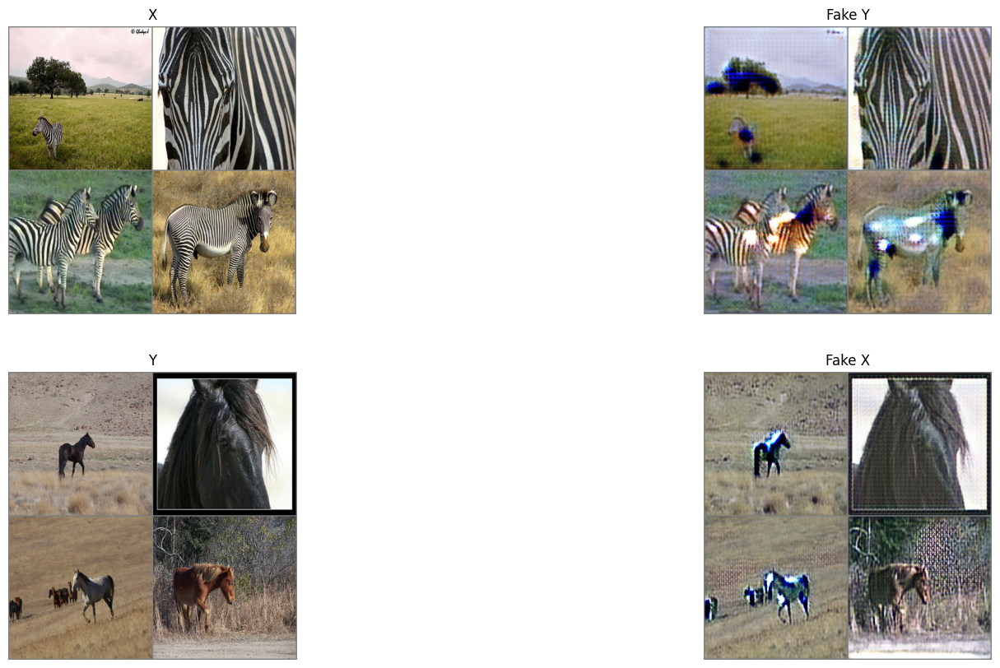

Epoch [   11/  128] | d_total_loss_avg: 0.2935 | g_total_loss: 3.6061
Epoch [   12/  128] | d_total_loss_avg: 0.2889 | g_total_loss: 3.5725
Epoch [   13/  128] | d_total_loss_avg: 0.2728 | g_total_loss: 3.5318
Epoch [   14/  128] | d_total_loss_avg: 0.2578 | g_total_loss: 3.5004
Epoch [   15/  128] | d_total_loss_avg: 0.2731 | g_total_loss: 3.4858
Epoch [   16/  128] | d_total_loss_avg: 0.2381 | g_total_loss: 3.4635
Epoch [   17/  128] | d_total_loss_avg: 0.2579 | g_total_loss: 3.4651
Epoch [   18/  128] | d_total_loss_avg: 0.2367 | g_total_loss: 3.4307
Epoch [   19/  128] | d_total_loss_avg: 0.2294 | g_total_loss: 3.4276
Epoch [   20/  128] | d_total_loss_avg: 0.2534 | g_total_loss: 3.3897


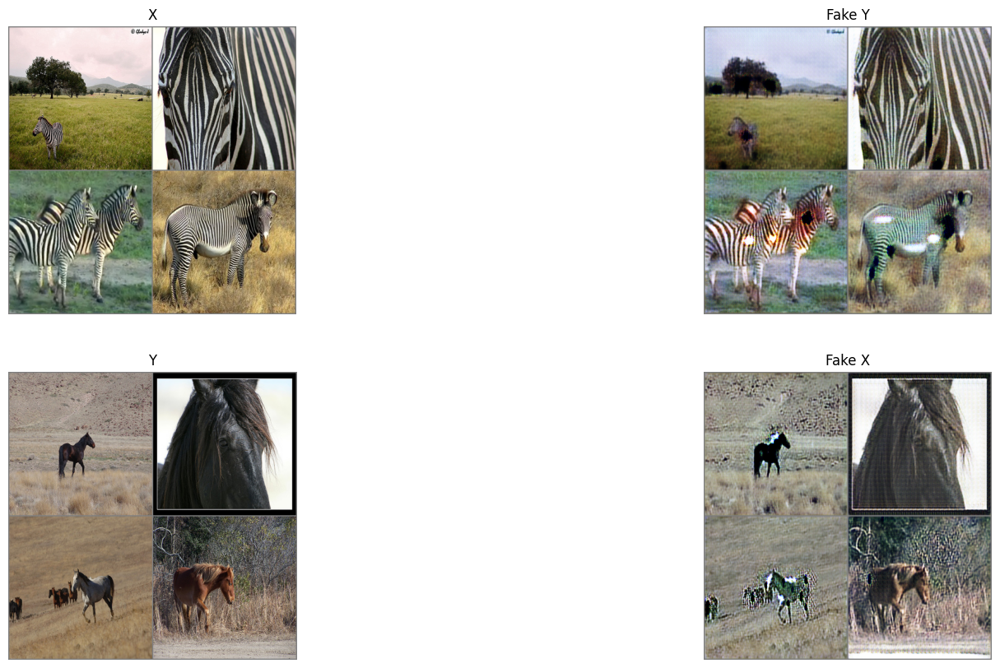

Epoch [   21/  128] | d_total_loss_avg: 0.2319 | g_total_loss: 3.3736
Epoch [   22/  128] | d_total_loss_avg: 0.2348 | g_total_loss: 3.3755
Epoch [   23/  128] | d_total_loss_avg: 0.2218 | g_total_loss: 3.3361
Epoch [   24/  128] | d_total_loss_avg: 0.2234 | g_total_loss: 3.3473
Epoch [   25/  128] | d_total_loss_avg: 0.2097 | g_total_loss: 3.3337
Epoch [   26/  128] | d_total_loss_avg: 0.2247 | g_total_loss: 3.3292
Epoch [   27/  128] | d_total_loss_avg: 0.2155 | g_total_loss: 3.2860
Epoch [   28/  128] | d_total_loss_avg: 0.2094 | g_total_loss: 3.3044
Epoch [   29/  128] | d_total_loss_avg: 0.2088 | g_total_loss: 3.2804
Epoch [   30/  128] | d_total_loss_avg: 0.2156 | g_total_loss: 3.2719


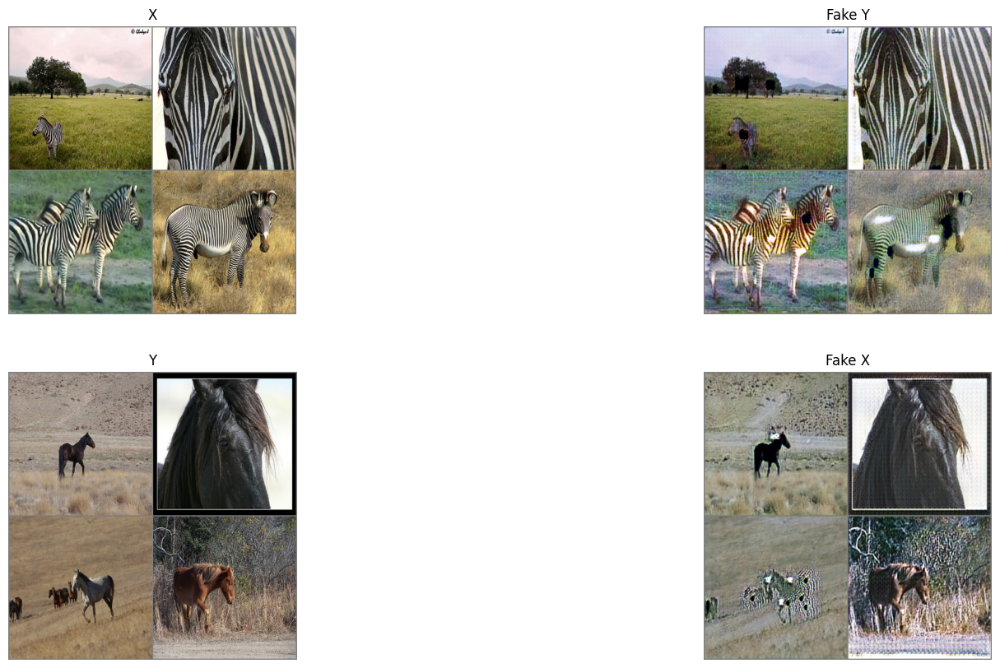

Epoch [   31/  128] | d_total_loss_avg: 0.2051 | g_total_loss: 3.2804
Epoch [   32/  128] | d_total_loss_avg: 0.2025 | g_total_loss: 3.2848
Epoch [   33/  128] | d_total_loss_avg: 0.1975 | g_total_loss: 3.2433
Epoch [   34/  128] | d_total_loss_avg: 0.2057 | g_total_loss: 3.2575
Epoch [   35/  128] | d_total_loss_avg: 0.2011 | g_total_loss: 3.2519
Epoch [   36/  128] | d_total_loss_avg: 0.1926 | g_total_loss: 3.2363
Epoch [   37/  128] | d_total_loss_avg: 0.1931 | g_total_loss: 3.2205
Epoch [   38/  128] | d_total_loss_avg: 0.1994 | g_total_loss: 3.2458
Epoch [   39/  128] | d_total_loss_avg: 0.1977 | g_total_loss: 3.1932
Epoch [   40/  128] | d_total_loss_avg: 0.1871 | g_total_loss: 3.2102


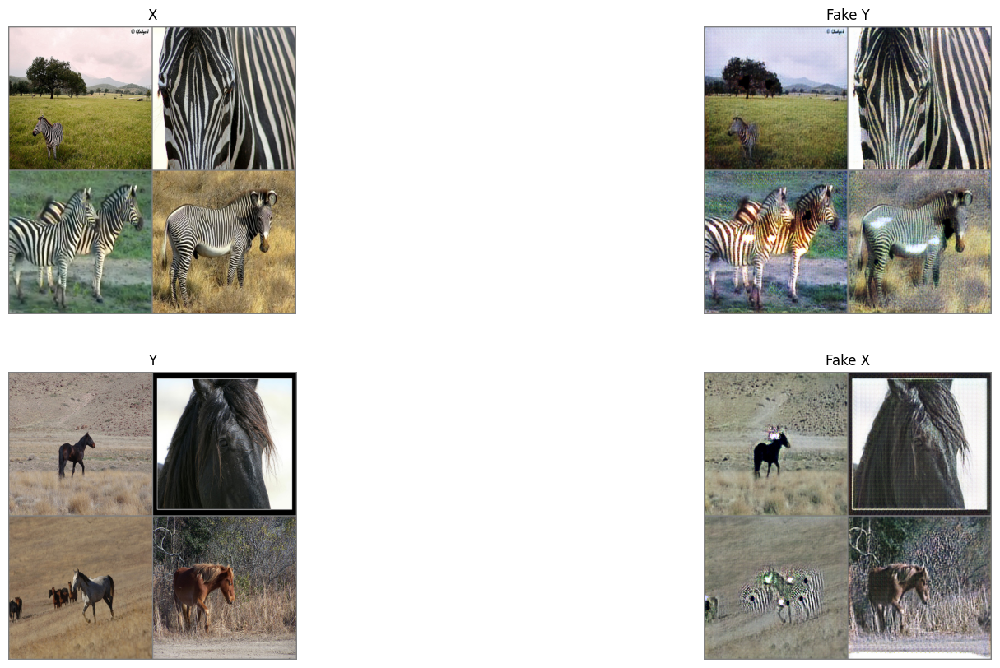

Epoch [   41/  128] | d_total_loss_avg: 0.1821 | g_total_loss: 3.2140
Epoch [   42/  128] | d_total_loss_avg: 0.1877 | g_total_loss: 3.1769
Epoch [   43/  128] | d_total_loss_avg: 0.1895 | g_total_loss: 3.2167
Epoch [   44/  128] | d_total_loss_avg: 0.1783 | g_total_loss: 3.1909
Epoch [   45/  128] | d_total_loss_avg: 0.1941 | g_total_loss: 3.1733
Epoch [   46/  128] | d_total_loss_avg: 0.1798 | g_total_loss: 3.1919
Epoch [   47/  128] | d_total_loss_avg: 0.1740 | g_total_loss: 3.1773
Epoch [   48/  128] | d_total_loss_avg: 0.1892 | g_total_loss: 3.1742
Epoch [   49/  128] | d_total_loss_avg: 0.1761 | g_total_loss: 3.1624
Epoch [   50/  128] | d_total_loss_avg: 0.1760 | g_total_loss: 3.1922


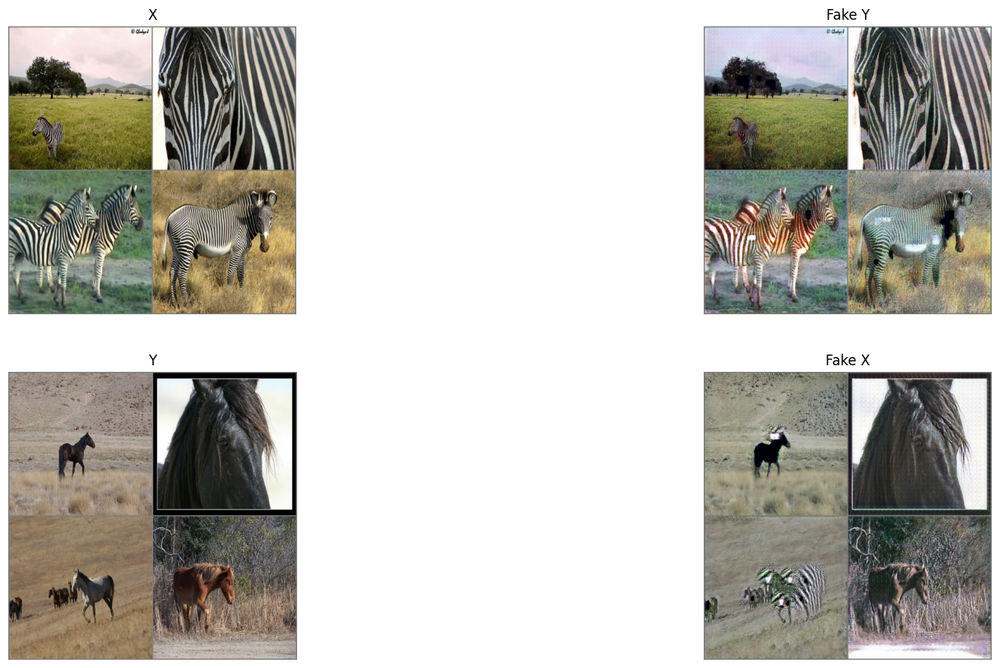

Epoch [   51/  128] | d_total_loss_avg: 0.1787 | g_total_loss: 3.1627
Epoch [   52/  128] | d_total_loss_avg: 0.1775 | g_total_loss: 3.1756
Epoch [   53/  128] | d_total_loss_avg: 0.1737 | g_total_loss: 3.1570
Epoch [   54/  128] | d_total_loss_avg: 0.1718 | g_total_loss: 3.1510
Epoch [   55/  128] | d_total_loss_avg: 0.1647 | g_total_loss: 3.1716
Epoch [   56/  128] | d_total_loss_avg: 0.1672 | g_total_loss: 3.1525
Epoch [   57/  128] | d_total_loss_avg: 0.1721 | g_total_loss: 3.1681
Epoch [   58/  128] | d_total_loss_avg: 0.1516 | g_total_loss: 3.1388
Epoch [   59/  128] | d_total_loss_avg: 0.1620 | g_total_loss: 3.1741
Epoch [   60/  128] | d_total_loss_avg: 0.1550 | g_total_loss: 3.1485


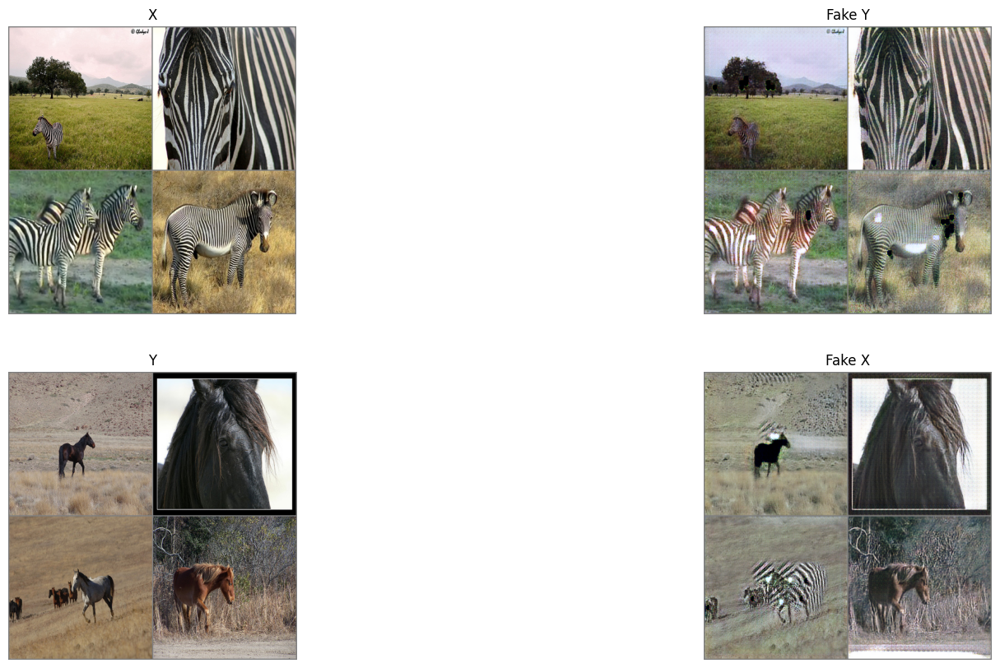

Epoch [   61/  128] | d_total_loss_avg: 0.1680 | g_total_loss: 3.1341
Epoch [   62/  128] | d_total_loss_avg: 0.1589 | g_total_loss: 3.1186
Epoch [   63/  128] | d_total_loss_avg: 0.1617 | g_total_loss: 3.1538
Epoch [   64/  128] | d_total_loss_avg: 0.1560 | g_total_loss: 3.1198
Epoch [   65/  128] | d_total_loss_avg: 0.1567 | g_total_loss: 3.1434
Epoch [   66/  128] | d_total_loss_avg: 0.1561 | g_total_loss: 3.1308
Epoch [   67/  128] | d_total_loss_avg: 0.1555 | g_total_loss: 3.1208
Epoch [   68/  128] | d_total_loss_avg: 0.1399 | g_total_loss: 3.1507
Epoch [   69/  128] | d_total_loss_avg: 0.1448 | g_total_loss: 3.1482
Epoch [   70/  128] | d_total_loss_avg: 0.1520 | g_total_loss: 3.1366


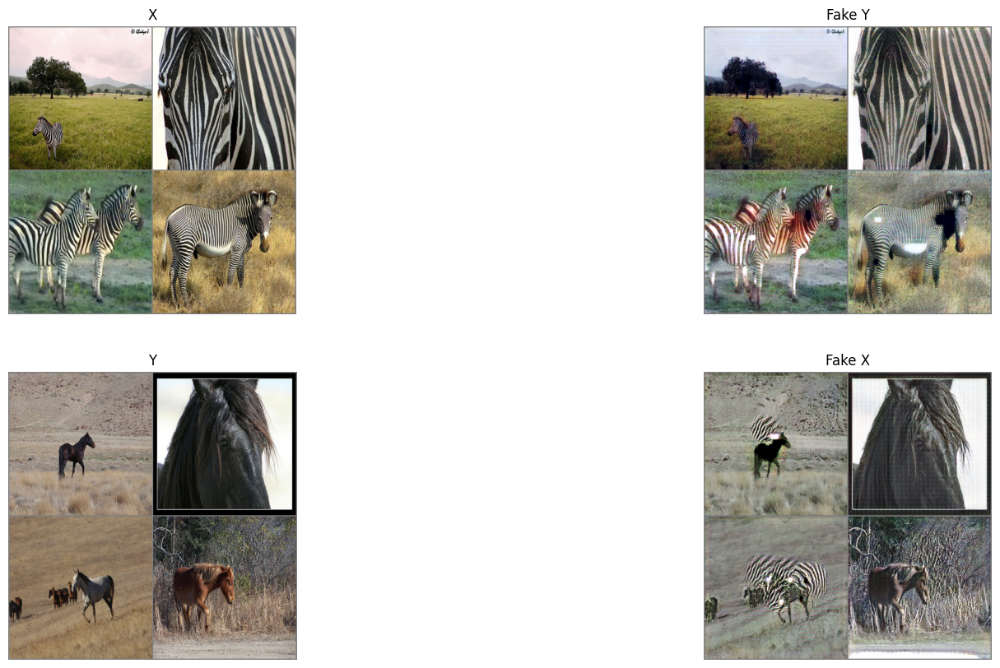

Epoch [   71/  128] | d_total_loss_avg: 0.1486 | g_total_loss: 3.1283
Epoch [   72/  128] | d_total_loss_avg: 0.1454 | g_total_loss: 3.1111
Epoch [   73/  128] | d_total_loss_avg: 0.1507 | g_total_loss: 3.1131
Epoch [   74/  128] | d_total_loss_avg: 0.1459 | g_total_loss: 3.1260
Epoch [   75/  128] | d_total_loss_avg: 0.1462 | g_total_loss: 3.1125
Epoch [   76/  128] | d_total_loss_avg: 0.1463 | g_total_loss: 3.1286
Epoch [   77/  128] | d_total_loss_avg: 0.1406 | g_total_loss: 3.1031
Epoch [   78/  128] | d_total_loss_avg: 0.1340 | g_total_loss: 3.1151
Epoch [   79/  128] | d_total_loss_avg: 0.1570 | g_total_loss: 3.1261
Epoch [   80/  128] | d_total_loss_avg: 0.1340 | g_total_loss: 3.1197


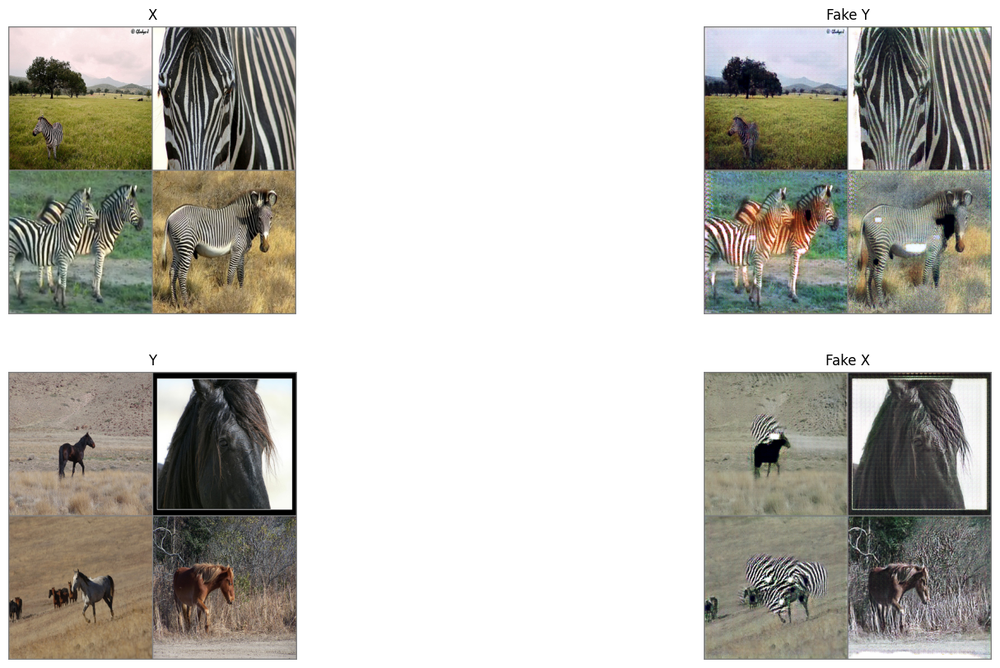

Epoch [   81/  128] | d_total_loss_avg: 0.1463 | g_total_loss: 3.0954
Epoch [   82/  128] | d_total_loss_avg: 0.1322 | g_total_loss: 3.1032
Epoch [   83/  128] | d_total_loss_avg: 0.1402 | g_total_loss: 3.0949
Epoch [   84/  128] | d_total_loss_avg: 0.1396 | g_total_loss: 3.1078
Epoch [   85/  128] | d_total_loss_avg: 0.1303 | g_total_loss: 3.1098
Epoch [   86/  128] | d_total_loss_avg: 0.1480 | g_total_loss: 3.0925
Epoch [   87/  128] | d_total_loss_avg: 0.1407 | g_total_loss: 3.0799
Epoch [   88/  128] | d_total_loss_avg: 0.1349 | g_total_loss: 3.0800
Epoch [   89/  128] | d_total_loss_avg: 0.1396 | g_total_loss: 3.1033
Epoch [   90/  128] | d_total_loss_avg: 0.1434 | g_total_loss: 3.0751


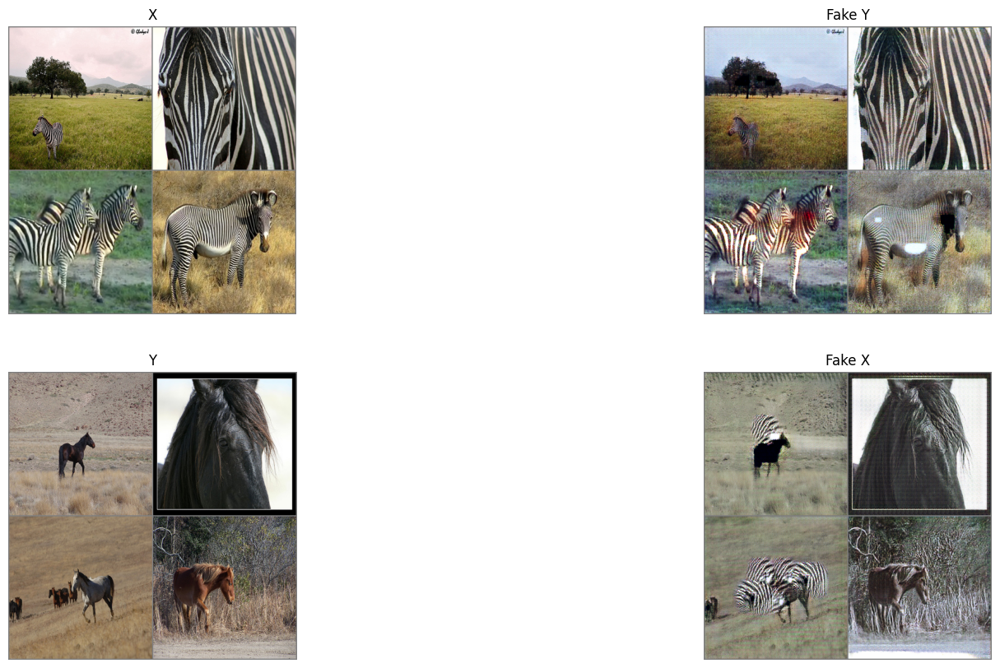

Epoch [   91/  128] | d_total_loss_avg: 0.1365 | g_total_loss: 3.0659
Epoch [   92/  128] | d_total_loss_avg: 0.1259 | g_total_loss: 3.0807
Epoch [   93/  128] | d_total_loss_avg: 0.1361 | g_total_loss: 3.0716
Epoch [   94/  128] | d_total_loss_avg: 0.1486 | g_total_loss: 3.0679
Epoch [   95/  128] | d_total_loss_avg: 0.1329 | g_total_loss: 3.0666
Epoch [   96/  128] | d_total_loss_avg: 0.1642 | g_total_loss: 3.0498
Epoch [   97/  128] | d_total_loss_avg: 0.1242 | g_total_loss: 3.0640
Epoch [   98/  128] | d_total_loss_avg: 0.1278 | g_total_loss: 3.0654
Epoch [   99/  128] | d_total_loss_avg: 0.1221 | g_total_loss: 3.0899
Epoch [  100/  128] | d_total_loss_avg: 0.1286 | g_total_loss: 3.0545


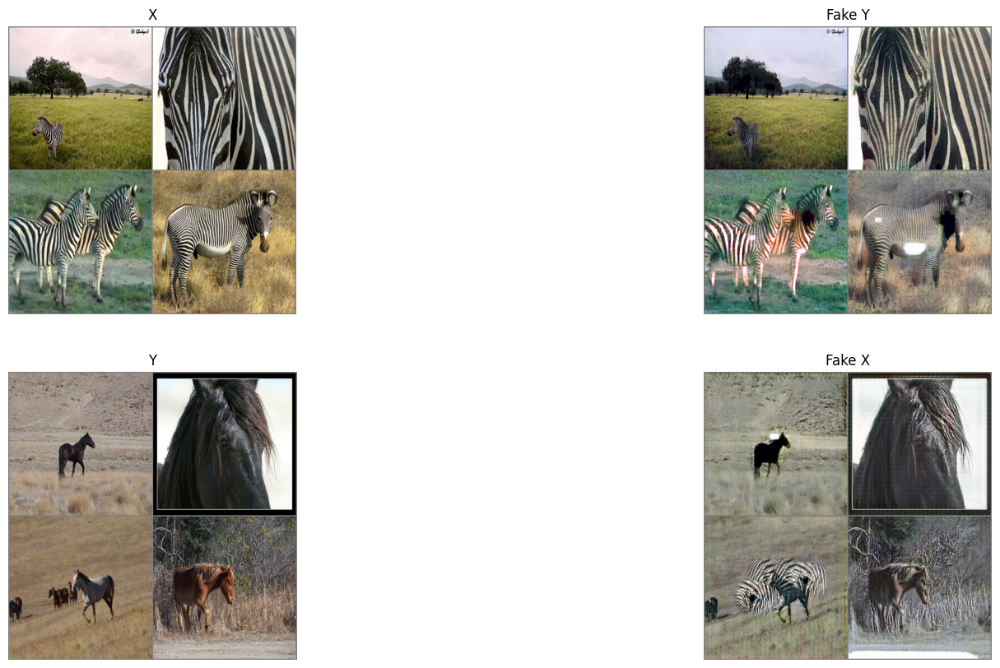

Epoch [  101/  128] | d_total_loss_avg: 0.1298 | g_total_loss: 3.0643
Epoch [  102/  128] | d_total_loss_avg: 0.1283 | g_total_loss: 3.0620
Epoch [  103/  128] | d_total_loss_avg: 0.1333 | g_total_loss: 3.0658
Epoch [  104/  128] | d_total_loss_avg: 0.1380 | g_total_loss: 3.0769
Epoch [  105/  128] | d_total_loss_avg: 0.1208 | g_total_loss: 3.0705
Epoch [  106/  128] | d_total_loss_avg: 0.1377 | g_total_loss: 3.0737
Epoch [  107/  128] | d_total_loss_avg: 0.1110 | g_total_loss: 3.0835
Epoch [  108/  128] | d_total_loss_avg: 0.1277 | g_total_loss: 3.0655
Epoch [  109/  128] | d_total_loss_avg: 0.1166 | g_total_loss: 3.0582
Epoch [  110/  128] | d_total_loss_avg: 0.1169 | g_total_loss: 3.0562


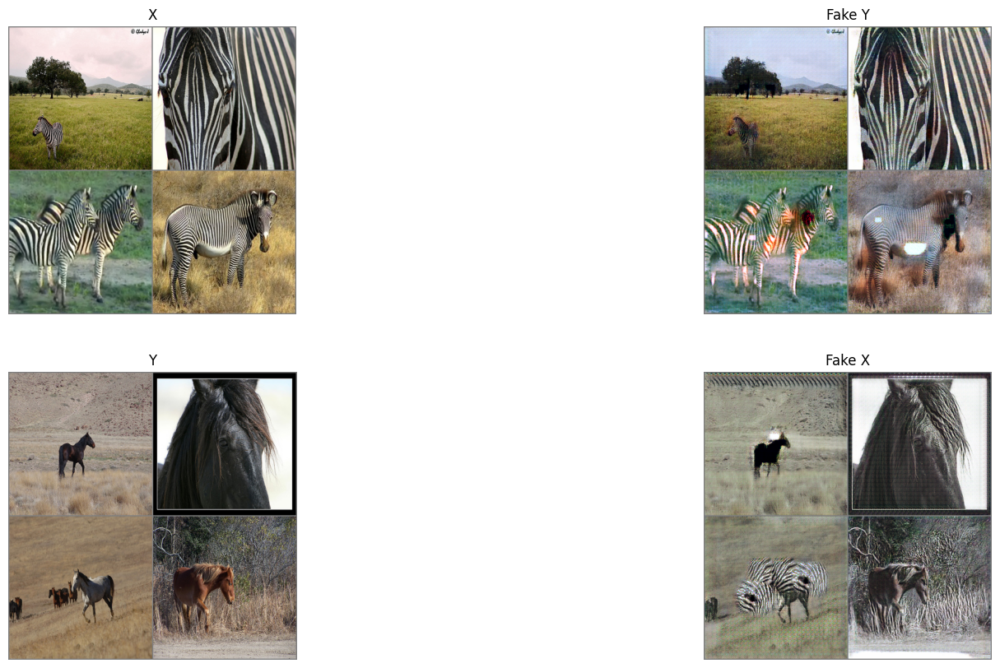

Epoch [  111/  128] | d_total_loss_avg: 0.1221 | g_total_loss: 3.0733
Epoch [  112/  128] | d_total_loss_avg: 0.1218 | g_total_loss: 3.0639
Epoch [  113/  128] | d_total_loss_avg: 0.1250 | g_total_loss: 3.0544
Epoch [  114/  128] | d_total_loss_avg: 0.1263 | g_total_loss: 3.0432
Epoch [  115/  128] | d_total_loss_avg: 0.1174 | g_total_loss: 3.0579
Epoch [  116/  128] | d_total_loss_avg: 0.1260 | g_total_loss: 3.0653
Epoch [  117/  128] | d_total_loss_avg: 0.1144 | g_total_loss: 3.0300
Epoch [  118/  128] | d_total_loss_avg: 0.1232 | g_total_loss: 3.0393
Epoch [  119/  128] | d_total_loss_avg: 0.1194 | g_total_loss: 3.0483
Epoch [  120/  128] | d_total_loss_avg: 0.1213 | g_total_loss: 3.0489


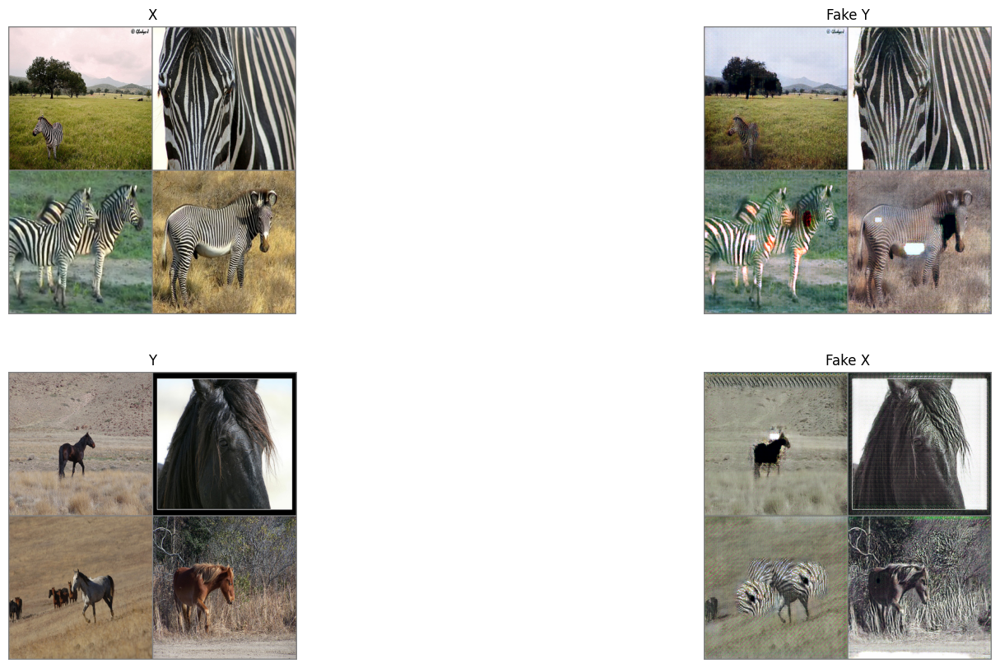

Epoch [  121/  128] | d_total_loss_avg: 0.1137 | g_total_loss: 3.0644
Epoch [  122/  128] | d_total_loss_avg: 0.1214 | g_total_loss: 3.0288
Epoch [  123/  128] | d_total_loss_avg: 0.1256 | g_total_loss: 3.0359
Epoch [  124/  128] | d_total_loss_avg: 0.1151 | g_total_loss: 3.0432
Epoch [  125/  128] | d_total_loss_avg: 0.1122 | g_total_loss: 3.0403
Epoch [  126/  128] | d_total_loss_avg: 0.1013 | g_total_loss: 3.0817
Epoch [  127/  128] | d_total_loss_avg: 0.1199 | g_total_loss: 3.0518
Epoch [  128/  128] | d_total_loss_avg: 0.1149 | g_total_loss: 3.0366


In [89]:
batches_per_epoch = min(len(dataloader_X), len(dataloader_Y))
epoch_true = 128
n_epochs = epoch_true * batches_per_epoch
losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, \
                       test_dataloader_Y, n_epochs=n_epochs)

## Đánh giá mô hình

In [90]:
# def evaluate_model(dataloader_X, dataloader_Y, G_XtoY, G_YtoX, D_X, D_Y):
#     """
#     Evaluate the model on the given dataloaders
#     """
#     G_XtoY.eval()
#     G_YtoX.eval()
#     D_X.eval()
#     D_Y.eval()

#     total_loss = 0.0
#     with torch.no_grad():
#         for images_X, images_Y in zip(dataloader_X, dataloader_Y):
#             device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#             images_X = images_X.to(device)
#             images_Y = images_Y.to(device)
            
#             # Perform forward pass and compute losses
#             fake_Y = G_XtoY(images_X)
#             fake_X = G_YtoX(images_Y)
            
#             out_x = D_X(fake_X)
#             out_y = D_Y(fake_Y)
            
#             D_X_fake_loss = fake_mse_loss(out_x, 0.5)
#             D_Y_fake_loss = fake_mse_loss(out_y, 0.5)
            
#             total_loss += D_X_fake_loss.item() + D_Y_fake_loss.item()
    
#     avg_loss = total_loss / len(dataloader_X)
#     print(f"Avg Evaluation Loss: {avg_loss}")

######################
import torch

def evaluate_model(dataloader_X, dataloader_Y, G_XtoY, G_YtoX, D_X, D_Y):
    """
    Evaluate the model on the given dataloaders
    """
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    G_XtoY.to(device)
    G_YtoX.to(device)
    D_X.to(device)
    D_Y.to(device)

    G_XtoY.eval()
    G_YtoX.eval()
    D_X.eval()
    D_Y.eval()

    total_loss = 0.0
    with torch.no_grad():
        for images_X, images_Y in zip(dataloader_X, dataloader_Y):
            images_X = images_X.to(device)
            images_Y = images_Y.to(device)
            
            # Perform forward pass and compute losses
            fake_Y = G_XtoY(images_X)
            fake_X = G_YtoX(images_Y)
            
            out_x = D_X(fake_X)
            out_y = D_Y(fake_Y)
            
            D_X_fake_loss = fake_mse_loss(out_x, 0.5)
            D_Y_fake_loss = fake_mse_loss(out_y, 0.5)
            
            total_loss += D_X_fake_loss.item() + D_Y_fake_loss.item()
    
    avg_loss = total_loss / len(dataloader_X)
    print(f"Avg Evaluation Loss: {avg_loss}")



In [91]:
n_epochs, epoch_true

(17152, 128)

In [92]:
a = '/kaggle/working/G_XtoY_15000.pkl'
b = '/kaggle/working/G_YtoX_15000.pkl'
c = '/kaggle/working/D_X_15000.pkl'
d = '/kaggle/working/D_Y_15000.pkl'

G_XtoY_path = torch.load(a)
G_YtoX_path = torch.load(b)
D_X_path = torch.load(c)
D_Y_path = torch.load(d)

In [93]:
g_conv_dim=64
d_conv_dim=64
n_res_blocks=6

G_XtoYt = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
G_YtoXt = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks) 
D_Xt = Discriminator(conv_dim=d_conv_dim)
D_Yt = Discriminator(conv_dim=d_conv_dim)

G_XtoYt.load_state_dict(torch.load(a, map_location=torch.device('cpu')))
G_YtoXt.load_state_dict(torch.load(b, map_location=torch.device('cpu')))
D_Xt.load_state_dict(torch.load(c, map_location=torch.device('cpu')))
D_Yt.load_state_dict(torch.load(d, map_location=torch.device('cpu')))

<All keys matched successfully>

In [94]:
evaluate_model(test_dataloader_X, test_dataloader_Y, G_XtoYt, G_YtoXt, D_Xt, D_Yt)

Avg Evaluation Loss: 0.04327108390896977


### Trực quan

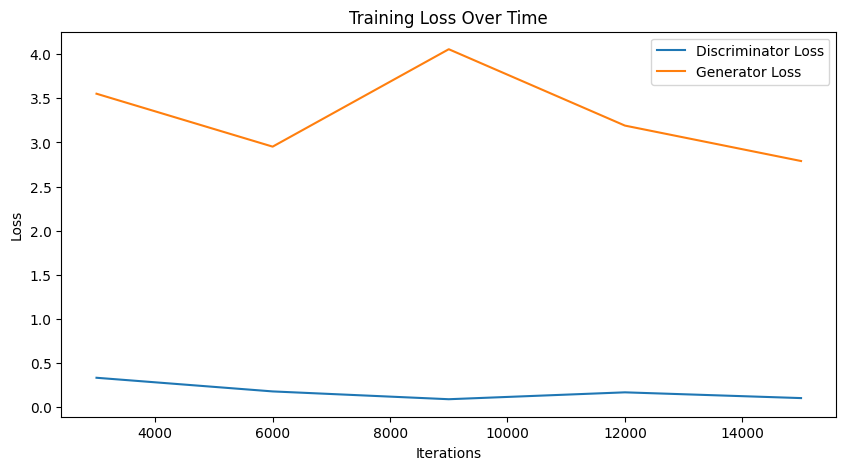

In [96]:
import matplotlib.pyplot as plt

def plot_training_loss(checkpoint_dir):
    """
    Vẽ biểu đồ quá trình training dựa vào các checkpoint đã lưu
    """
    losses_path = os.path.join(checkpoint_dir, 'losses_.txt')
    iterations = []
    d_losses_avg = []
    g_losses_avg = []
    d_losses = []
    g_losses = []
    
    with open(losses_path, 'r') as f:
        for line in f:
            iteration, d_loss_avg, g_loss_avg, d_loss, g_loss = line.strip().split(',')
            iterations.append(int(iteration))
            d_losses_avg.append(float(d_loss_avg))
            g_losses_avg.append(float(g_loss_avg))
            d_losses.append(float(d_loss))
            g_losses.append(float(g_loss))
    
    plt.figure(figsize=(10, 5))
    plt.plot(iterations, d_losses, label='Discriminator Loss')
    plt.plot(iterations, g_losses, label='Generator Loss')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title('Training Loss Over Time')
    plt.legend()
    plt.show()

# Vẽ biểu đồ
checkpoint_dir = '/kaggle/working/'
plot_training_loss(checkpoint_dir)

In [97]:
import torch
import torch.nn.functional as F

def evaluate_cycle_consistency_loss(dataloader_X, dataloader_Y, G_XtoY, G_YtoX, lambda_weight=10.0):
    """
    Evaluate the cycle consistency loss on the given dataloaders
    """
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    G_XtoY.to(device)
    G_YtoX.to(device)

    G_XtoY.eval()
    G_YtoX.eval()

    total_cycle_consistency_loss = 0.0
    with torch.no_grad():
        for images_X, images_Y in zip(dataloader_X, dataloader_Y):
            images_X = images_X.to(device)
            images_Y = images_Y.to(device)
            
            # Forward pass through generators
            fake_Y = G_XtoY(images_X)
            fake_X = G_YtoX(images_Y)
            
            reconstructed_X = G_YtoX(fake_Y)
            reconstructed_Y = G_XtoY(fake_X)
            
            # Compute cycle consistency loss
            loss_X = F.l1_loss(reconstructed_X, images_X)
            loss_Y = F.l1_loss(reconstructed_Y, images_Y)
            
            total_cycle_consistency_loss += loss_X.item() + loss_Y.item()
    
    avg_cycle_consistency_loss = total_cycle_consistency_loss / len(dataloader_X)
    print(f"Avg Cycle Consistency Loss: {avg_cycle_consistency_loss}")

# Assuming the models and dataloaders are defined
evaluate_cycle_consistency_loss(test_dataloader_X, test_dataloader_Y, G_XtoYt, G_YtoXt)


Avg Cycle Consistency Loss: 0.22911695861620104
